## Spotify Music Data Analysis
#### The primary goal of this project is to perform data cleaning, exploratory data analysis (EDA), and visualization to extract insights from the dataset. By leveraging Python libraries like Pandas, NumPy, Matplotlib, Seaborn, and others, we aim to answer key questions about music trends and listener behavior.

In [2]:
# importing the lib

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# read the dataset

df = pd.read_csv('Spotify_data.csv')

In [4]:
# viewing the first few rows of the dataset
# the head() function displays the first 5 rows of the dataframe
df.head()

,Artist,Track,Album,Album_type,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,Title,Channel,Views,Likes,Comments,Licensed,official_video,Stream,EnergyLiveness,most_playedon
0,Gorillaz,Feel Good Inc.,Demon Days,album,0.818,0.705,-6.679,0.1770,0.008360,0.002330,...,Gorillaz - Feel Good Inc. (Official Video),Gorillaz,693555221,6220896,169907,TRUE,TRUE,1040234854,1.150082,Spotify
1,Gorillaz,Rhinestone Eyes,Plastic Beach,album,0.676,0.703,-5.815,0.0302,0.086900,0.000687,...,Gorillaz - Rhinestone Eyes [Storyboard Film] (...,Gorillaz,72011645,1079128,31003,TRUE,TRUE,310083733,15.183585,Spotify
2,Gorillaz,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),single,0.695,0.923,-3.930,0.0522,0.042500,0.046900,...,Gorillaz - New Gold ft. Tame Impala & Bootie B...,Gorillaz,8435055,282142,7399,TRUE,TRUE,63063467,7.956897,Spotify
3,Gorillaz,On Melancholy Hill,Plastic Beach,album,0.689,0.739,-5.810,0.0260,0.000015,0.509000,...,Gorillaz - On Melancholy Hill (Official Video),Gorillaz,211754952,1788577,55229,TRUE,TRUE,434663559,11.546875,Spotify
4,Gorillaz,Clint Eastwood,Gorillaz,album,0.663,0.694,-8.627,0.1710,0.025300,0.000000,...,Gorillaz - Clint Eastwood (Official Video),Gorillaz,618480958,6197318,155930,TRUE,TRUE,617259738,9.942693,Youtube


In [5]:
df.columns

Index(['Artist', 'Track', 'Album', 'Album_type', 'Danceability', 'Energy',
       'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness',
       'Liveness', 'Valence', 'Tempo', 'Duration_min', 'Title', 'Channel',
       'Views', 'Likes', 'Comments', 'Licensed', 'official_video', 'Stream',
       'EnergyLiveness', 'most_playedon'],
      dtype='object')

In [6]:
df[['Duration_min', 'Artist', 'Track', 'most_playedon','Licensed', 'official_video', 'Title', 'Channel']].head()

,Duration_min,Artist,Track,most_playedon,Licensed,official_video,Title,Channel
0,3.710667,Gorillaz,Feel Good Inc.,Spotify,TRUE,TRUE,Gorillaz - Feel Good Inc. (Official Video),Gorillaz
1,3.336217,Gorillaz,Rhinestone Eyes,Spotify,TRUE,TRUE,Gorillaz - Rhinestone Eyes [Storyboard Film] (...,Gorillaz
2,3.585833,Gorillaz,New Gold (feat. Tame Impala and Bootie Brown),Spotify,TRUE,TRUE,Gorillaz - New Gold ft. Tame Impala & Bootie B...,Gorillaz
3,3.897783,Gorillaz,On Melancholy Hill,Spotify,TRUE,TRUE,Gorillaz - On Melancholy Hill (Official Video),Gorillaz
4,5.682000,Gorillaz,Clint Eastwood,Youtube,TRUE,TRUE,Gorillaz - Clint Eastwood (Official Video),Gorillaz


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20594 entries, 0 to 20593
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            20594 non-null  object 
 1   Track             20594 non-null  object 
 2   Album             20594 non-null  object 
 3   Album_type        20594 non-null  object 
 4   Danceability      20594 non-null  float64
 5   Energy            20594 non-null  float64
 6   Loudness          20594 non-null  float64
 7   Speechiness       20594 non-null  float64
 8   Acousticness      20594 non-null  float64
 9   Instrumentalness  20594 non-null  float64
 10  Liveness          20594 non-null  float64
 11  Valence           20594 non-null  float64
 12  Tempo             20594 non-null  float64
 13  Duration_min      20594 non-null  float64
 14  Title             20594 non-null  object 
 15  Channel           20594 non-null  object 
 16  Views             20594 non-null  int64 

--> RangeIndex: 20594 entries, 0 to 20593.
--> Data columns (total 24 columns).
--> Categorical features contain the object type data_type.

In [9]:
# TOTAL ROWS AND COLUMNS
print(f'Dataset contains {df.shape[0]} rows and {df.shape[1]} columns."')

Dataset contains 20594 rows and 24 columns."


In [10]:
# I will change the data type of 'Licensed','official_video', because the data type of these two features are in object but the actual values should be in Boolean type.
df[['Licensed','official_video']]

,Licensed,official_video
0,TRUE,TRUE
1,TRUE,TRUE
2,TRUE,TRUE
3,TRUE,TRUE
4,TRUE,TRUE
...,...,...
20589,TRUE,TRUE
20590,TRUE,TRUE
20591,TRUE,TRUE
20592,TRUE,TRUE


In [11]:
# changing the data type
df['Licensed'] = df['Licensed'].astype(bool)
df['official_video'] = df['official_video'].astype(bool)

In [12]:
# print data type for changed ones.
print(df["Licensed"].dtype)
print(df["official_video"].dtype)

bool
bool


In [13]:
# checking missing value if any.

df.isnull().sum()

Artist              0
Track               0
Album               0
Album_type          0
Danceability        0
Energy              0
Loudness            0
Speechiness         0
Acousticness        0
Instrumentalness    0
Liveness            0
Valence             0
Tempo               0
Duration_min        0
Title               0
Channel             0
Views               0
Likes               0
Comments            0
Licensed            0
official_video      0
Stream              0
EnergyLiveness      2
most_playedon       0
dtype: int64

###### --> So Column name 'EnergyLiveness' have 2 null values.
###### --> We can handle these missing values by deleting these 2 rows or mean/median.mode or a forward filling. 
###### --> I will not use fillna('missing', inplace = True).
###### --> Because the missing values are very few, so I will delete these 2 rows to handle the missing values.
###### --> I'll use dropna(inplace = True)

In [15]:
# Delete the missing values

df.dropna(inplace = True)
df.isnull().sum()

Artist              0
Track               0
Album               0
Album_type          0
Danceability        0
Energy              0
Loudness            0
Speechiness         0
Acousticness        0
Instrumentalness    0
Liveness            0
Valence             0
Tempo               0
Duration_min        0
Title               0
Channel             0
Views               0
Likes               0
Comments            0
Licensed            0
official_video      0
Stream              0
EnergyLiveness      0
most_playedon       0
dtype: int64

In [16]:
# Now checking for duplicate records if any.

df.duplicated().sum()

0

###### --> So I have checked above, there is no duplicate records in the dataset.
###### --> If I supposed to have the duplicate records, then I definately delete them to make data consistent using df.drop_duplicates(inplace=True).

In [18]:
# some statistical measures : 
# here it only consists the numerical features not categorical.
df.describe() 

,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_min,Views,Likes,Comments,Stream,EnergyLiveness
count,20592.000000,20592.000000,20592.000000,20592.000000,20592.000000,20592.000000,20592.000000,20592.000000,20592.000000,20592.000000,2.059200e+04,2.059200e+04,2.059200e+04,2.059200e+04,20592.000000
mean,0.620162,0.635238,-7.678999,0.096742,0.291419,0.056167,0.193672,0.530128,120.574326,3.742802,9.204529e+07,6.480451e+05,2.684902e+04,1.326451e+08,5.167227
std,0.165399,0.214193,4.639089,0.112183,0.286117,0.193630,0.168829,0.245499,29.565662,2.084986,2.726146e+08,1.773725e+06,1.911843e+05,2.423699e+08,4.117431
min,0.000000,0.000020,-46.251000,0.000000,0.000001,0.000000,0.014500,0.000000,0.000000,0.516417,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000049
25%,0.519000,0.507000,-8.868250,0.035700,0.045200,0.000000,0.094100,0.340000,96.994750,2.997546,1.478416e+06,1.754600e+04,4.060000e+02,1.558757e+07,2.386190
50%,0.638000,0.666000,-6.541000,0.050700,0.193000,0.000002,0.125000,0.538000,119.959500,3.551433,1.331348e+07,1.153155e+05,3.006000e+03,4.730244e+07,4.256881
75%,0.741000,0.798000,-4.935000,0.104000,0.477000,0.000474,0.237000,0.727000,139.924500,4.202329,6.740061e+07,5.000950e+05,1.373900e+04,1.343384e+08,6.822034
max,0.975000,1.000000,0.920000,0.964000,0.996000,1.000000,1.000000,0.993000,243.372000,77.934300,8.079649e+09,5.078865e+07,1.608314e+07,3.386520e+09,59.113924


### A. Audio Features Analysis, Based on Statistical Measures:
#### --> 1. Audio: 
                a. Most songs have a moderate to high danceability score (~62%).
                b. min = 0.0000, shows that there are some songs which have 0 danceability.
                c. 75% = 0.741000, shows that the top 25% of songs have a danceability score above 0.74, means highly danceable tracks.
#### --> 2. Energy :
                a. 25% of the songs have an energy score ≤ 0.507 (low-energy music). energy score more than 0.50 comes for high energetic music.
                b. 75% of the songs have an energy level between 0.507 and 1.00.(High energy music).
                c. so spotify have 75% of the songs of high energy level which is more than 0.507.
                d. min = 0.000020, shows that some songs have very low energy level. (May be aliens sing those song, Ha!, like me.)
#### --> 3. Loudness(dB):
                a. The top 25% of songs have a loudness above -4.93.
                b. mean = -7.678999, Range = -46.25 to 0.92. shows mix of soft and loud music.
                c. min = -46.251000 is very far from the 75% percentile = -4.935000, and max = 0.920000 is very near to 75th percentile, 
                        show most songs in dataset are loud. and mean = -7.678999 is also nearer to max. where min = -46.251000(seems outlier).
#### --> 4. Speechiness(may be rap songs or audiobooks):
                a. Most songs have low speechiness. beacuse mean =  0.096742 is near to 0.0000 and far from 75% = 0.104000.
                b. the 75th percentile value is 0.104, shows that the majority of songs have very little speech-like songs.
                c. some tracks here are almost entirely spoken because max = 0.964000.
#### --> 5. Acousticness (Mean = 0.291419, Range = 0.00 - 0.99):
                a. acaustic meaning: (of popular music or musical instruments) not having electrical amplification.
                b. mean = 0.291419 shows that mostly songs are electrically amplified rather than purely acaustic.
                c. 75% = 0.477000 means that more that 75 percentage of songs are not that much of acaustic as below 25% = 0.045200. so mostly are electrically amplified songs.
#### --> 6. Instrumentalness: (to understand: songs either have instruments or vocal or both)
                a. 50% = 0.000002, many songs have very low instrumentalness, which meaning having vocals in songs.
                b. max = 1.000000, some songs are completely instrumental based.
#### --> 7. Liveness: (having live performance, experience of liveness.)
                a. some high-liveness tracks (1.00) might be fully live performances, perhaps live concerts.
                b. mean = 0.193672, 25% = 0.094100, 50% = 0.125000, 75% = 0.237000
                c. meadian (50%) = 0.1250 is not much high, than mean = 193672, shows not much songs are live performance because of low value of meadian.
                d. 25% = 0.094100 show 25% of the song have very low liveness shows may be no live performance, or very low. purely and properly studio records.
                e. Only 25% of songs gives the liveness value above 0.237. these kind of songs may have included the live performances.
                f. Can I say that to listen live performance music are not that much desirable on music app like spotify here.
#### --> 8. Valence: (meaning : describes the musical positivity conveyed by a piece of music. Songs with high valence sound more positive(e.g. happy, cheerful). low valance = sad(melancholic songs)) 
                a.  mean = 0.530128, 50% = 0.538000(almost half of max = 993000), min = 0.000000, max = 0.993000, seems a balance because of mean.
#### --> 9. Tempo: (meaning: Tempo is the speed of a given piece of music. It is most commonly measured by the number of beats that occur in a minute known as beats per minute (BPM).)
                a. Some songs have very high tempos 243.372000 BPM. may be electrically amplified music. Extremely Fast like Electronic dance music (EDM).
                b. mean = 120.574326 BPM. 50% = 119.959500.
                c. ambient music may have the tempo close to min = 0.000000.

In [20]:
### A. Audio Features Analysis:[ABOVE]
### B.Popularity & Engagement Analysis:[BELOW]

# Change display format to show full numbers
pd.options.display.float_format = '{:,.0f}'.format  # No decimal places, with commas

# above code helped me to convert view and likes into proper number formate.
df.describe()

,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_min,Views,Likes,Comments,Stream,EnergyLiveness
count,"20,592","20,592","20,592","20,592","20,592","20,592","20,592","20,592","20,592","20,592","20,592","20,592","20,592","20,592","20,592"
mean,1,1,-8,0,0,0,0,1,121,4,"92,045,291","648,045","26,849","132,645,068",5
std,0,0,5,0,0,0,0,0,30,2,"272,614,628","1,773,725","191,184","242,369,943",4
min,0,0,-46,0,0,0,0,0,0,1,0,0,0,0,0
25%,1,1,-9,0,0,0,0,0,97,3,"1,478,416","17,546",406,"15,587,569",2
50%,1,1,-7,0,0,0,0,1,120,4,"13,313,480","115,316","3,006","47,302,445",4
75%,1,1,-5,0,0,0,0,1,140,4,"67,400,608","500,095","13,739","134,338,408",7
max,1,1,1,1,1,1,1,1,243,78,"8,079,649,362","50,788,652","16,083,138","3,386,520,288",59


### B.Popuarity & Engagement analysis:
###### --> 1. Views:
                a. The value 6.740061e+07 in scientific notation means: (6.740061 × 10^7 = 67,400,610). So, the 75th percentile of views is approximately 67.4 million views.
                b. The top 25% of songs have more than 67M views because of 75% = 67,400,608
                c. There are some of the songs which does not have a single view. May be new released.
                d. More than 75% of the songs have more than 1 million views.
###### --> 2. Likes:
                a. Meadian(50%) = 115,316 likes, max = 50,788,652 likes, shows outlier, may be because of viral or popular songs. max views > 8 million.	
###### --> 3. Comments: 
                a. max = 16,083,138. some songs having very high engagement => 16 Million comments.
###### --> 4. Streams: 
                a. Popular tracks have billions of streams.
###### --> 5. EnergyLiveness Feature: combination of energetic and live-performance
                a. some songs are both very lively and high-energy, live rock concerts perhaps.

In [22]:
# Now here is the statistical measures for categorical features also, which have data type, called object data type.
df.describe(include = ['O'])

,Artist,Track,Album,Album_type,Title,Channel,most_playedon
count,20592,20592,20592,20592,20592,20592,20592
unique,2074,17715,11853,3,18022,6673,2
top,Gorillaz,El Ultimo Adiós - Varios Artistas Version,Greatest Hits,album,0,0,Spotify
freq,10,24,30,14832,468,468,15692


In [24]:
# How many records are present in the dataset?
df.shape[0] # here using the shape attribute of a Pandas dataframe and check the number of rows by using index 0.

20592

##### As we can see, there are 20594 records in the dataset.

In [26]:
df.columns

Index(['Artist', 'Track', 'Album', 'Album_type', 'Danceability', 'Energy',
       'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness',
       'Liveness', 'Valence', 'Tempo', 'Duration_min', 'Title', 'Channel',
       'Views', 'Likes', 'Comments', 'Licensed', 'official_video', 'Stream',
       'EnergyLiveness', 'most_playedon'],
      dtype='object')

# Problems to solve

#### Q.1 What is the average danceability, energy, and loudness of all tracks in the dataset?

In [29]:
# average danceability, energy, and loudness 

avg_danceability  = df['Danceability'].mean() 
avg_energy = df['Energy'].mean()
avg_loudness = df['Loudness'].mean()

print(f'avg_danceability: {avg_danceability}')
print(f'avg_energy: {avg_energy}')
print(f'avg_loudness: {avg_loudness}')

avg_danceability: 0.6201620386557887
avg_energy: 0.6352377639034578
avg_loudness: -7.678999417249417


As we can see the average values of the three feature: Danceability, Energy, and Loudness

#### Q.2 What is the distribution of track durations (in minutes)? Are most tracks short or long?

In [32]:
# we have to look into Duration_min feature, and we have to find the mean, median, min, and max distribution.
# Duration_min : feature is already in minutes.

mean_duration = df['Duration_min'].mean() # mean_distribution
median_duration = df['Duration_min'].median()
min_duration = df['Duration_min'].min()
max_duration = df['Duration_min'].max()

print(f'The mean duration is: {mean_duration:.2f}')
print(f'The median duration is: {median_duration:.2f}')
print(f'The minimum duration is: {min_duration:.2f}')
print(f'The maximum duration is: {max_duration:.2f}')

# so
print(f'The shortest track is {min_duration:.2f} minutes')
print(f'The longest track is {max_duration:.2f} minutes')

mode_duration = df["Duration_min"].mode()[0]
print(f"Mode of Track Duration: {mode_duration:.2f} minutes")

The mean duration is: 3.74
The median duration is: 3.55
The minimum duration is: 0.52
The maximum duration is: 77.93
The shortest track is 0.52 minutes
The longest track is 77.93 minutes
Mode of Track Duration: 3.96 minutes


##### As we can see the distribution of track duration using some statistics above.

In [34]:
# now let's solve this part: Are most tracks short or long?
# we have mode = 3.96 minutes, and mean = 3.7424, adn median = 3.55. so if I assume 3 minutes is the threshold to declare a song short or long.
# i am using 3 minutes because it is close to median and using median would be better to handle the case.
# here using conditionals should be good.

if median_duration < 3:
    print('Most songs are short (based on median)')
elif median_duration > 4:
    print('Most songs are long (based on median)')
else:
    print('Most tracks are balanced.')

Most tracks are balanced.


##### As we can see in our dataset most songs are in balance if we talk about the track duration: neither very short nor very long.

### Q.3 Which artist has the most tracks in the dataset?

In [37]:
# there is another fnc to use called nlargest(1) instead of idx max() to select the top one.
top_artist = df['Artist'].value_counts().idxmax()
total_songs = df['Artist'].value_counts().max()

print(top_artist)
print(total_songs)

Gorillaz
10


##### As we can see here that in our dataset, the top artist name is Gorillaz and The total songs showing 10.

### Q.4 Which track has the highest number of streams, views, likes, and comments?

In [40]:
max_streams = df['Stream'].value_counts().max()  #.value_counts() --> Counts occurrences of each unique stream value in colmn.
max_views = df['Views'].value_counts().max()     #.max() ---  highest count from the value counts.
max_likes = df['Likes'].value_counts().max()
max_comments = df['Comments'].value_counts().max()

print(f'max_streams: {max_streams}')
print(f'max_views: {max_views}')
print(f'max_likes: {max_likes}')
print(f'max_comments: {max_comments}')

# Here we can see the  highest frequency of a single (streams, views, likes, and comments) count.  highest frequency of any single stream count.
# But have also find the specific track or song which have the highest of these 4 features.

max_streams: 576
max_views: 469
max_likes: 556
max_comments: 1064


In [41]:
# Now I will find the  Top song for each columns(streams, views, likes, and comments)
top_streams_song = df.loc[df['Stream'].idxmax(), 'Track'] # i am not using here value_counts() because it will give most frequent one, not most number of streams
top_views_song = df.loc[df['Views'].idxmax(), 'Track']
top_likes_song = df.loc[df['Likes'].idxmax(), 'Track']
top_comments_song = df.loc[df['Comments'].idxmax(), 'Track']

print(f'top_streams_song: {top_streams_song}')
print(f'top_views_song: {top_views_song}')
print(f'top_likes_song: {top_likes_song}')
print(f'top_comments_song: {top_comments_song}')

top_streams_song: Blinding Lights
top_views_song: Despacito
top_likes_song: Despacito
top_comments_song: Dynamite


##### So above I have printed the names of the top song from each column(streams, views, likes, and comments)
##### As we can see from above result that there is no specific top_song_name which comes with highest numbers under all 4 columns(streams, views, likes, and comments)

### Q.5 What is the average number of streams, views, likes, and comments?

In [44]:
avg_streams = df['Stream'].mean()
avg_views = df['Views'].mean()
avg_likes = df['Likes'].mean()
avg_comments = df['Comments'].mean()

print(f"Avg Streams: {avg_streams:.2f}, Avg Views: {avg_views:.2f}, Avg Likes: {avg_likes:.2f}, Avg Comments: {avg_comments:.2f}")

Avg Streams: 132645068.35, Avg Views: 92045291.10, Avg Likes: 648045.07, Avg Comments: 26849.02


##### As we can see, above are the average number for streams, views, likes, and comments.

### Q.6 How many tracks are singles, and how many are part of an album?

In [47]:
single_tracks = df['Album_type'].value_counts()
print(single_tracks)

Album_type
album          14832
single          4973
compilation      787
Name: count, dtype: int64


##### Above we can see the value count of Album and Single category song.
##### Album tracks are -- 14832 , Single tracks are --  4973

### Q.7 Which album has the most tracks in the dataset?

In [50]:
count_of_album = df['Album'].value_counts()
top_album = count_of_album.idxmax()  # Get album with the most tracks
top_album_count = count_of_album.max()  # Get count of the most frequent album

print("top_album: ", top_album)
print("top_album_count: ", top_album_count)

top_album:  Greatest Hits
top_album_count:  30


##### Now we can see here that the album which has the most tracks is 'Greatest Hits' having 30 songs.

### Q.8 What is the average tempo (BPM) of tracks in the dataset?

In [53]:
avg_tempo = df['Tempo'].mean()

print(avg_tempo)

120.57432604895104


##### SO the average tempo in BPM is 120.57432604895104.

### Q.9 What percentage of tracks are licensed?

In [56]:
total_rows = df['Track'].shape[0] # first I count the total number of rows of track column.
print(total_rows)

20592


In [57]:
total_licensed = df['Licensed'].sum() ## Sum of True values: Because licensed column is a boolean data type, it will summ all True values.
print(total_licensed)

# So i will have the total number of rows which have licensed true.

20592


In [58]:
perc = (total_licensed/total_rows) * 100 # counting percentage
print(perc)

100.0


##### Here we can say that 100 percentage of tracks are licensed.

### Q.10 Which artist has the highest average streams, views, likes, and comments?

In [61]:
hgst_avg_stream = df.groupby('Artist')['Stream'].mean().idxmax()
hgst_avg_views = df.groupby('Artist')['Views'].mean().idxmax()
hgst_avg_likes = df.groupby('Artist')['Likes'].mean().idxmax()
hgst_avg_comments = df.groupby('Artist')['Comments'].mean().idxmax()


print(hgst_avg_stream)
print(hgst_avg_views)
print(hgst_avg_likes)
print(hgst_avg_comments)

Post Malone
Ed Sheeran
BTS
BTS


In [62]:
# Method 2
avg_of_artist = df.groupby('Artist')[['Stream', 'Views', 'Likes', 'Comments']].mean()
top_artist = avg_of_artist.sum(axis=1).idxmax()                       # sum() --adding values across columns. 
print(top_artist)                                                     # axis=1 -- doing sum row-wise.

Ed Sheeran


##### As we can see that the artist which  has the highest average streams, views, likes, and comments is 'Ed Sheeran'.

### Q.11 Which audio feature (danceability, energy, speechiness, acousticness, etc.) is most strongly associated with high stream counts or views?

In [65]:
features = ['Stream', 'Views', 'Danceability', 'Energy', 'Speechiness', 'Acousticness']
df_col = df[features]

print(df_col)

           Stream      Views  Danceability  Energy  Speechiness  Acousticness
0      1040234854  693555221             1       1            0             0
1       310083733   72011645             1       1            0             0
2        63063467    8435055             1       1            0             0
3       434663559  211754952             1       1            0             0
4       617259738  618480958             1       1            0             0
...           ...        ...           ...     ...          ...           ...
20589     9227144      71678             1       1            0             0
20590    10898176     164741             1       1            0             0
20591     6226110      35646             0       1            0             0
20592     6873961       6533             0       1            0             0
20593     5695584     158697             0       1            0             0

[20592 rows x 6 columns]


In [66]:
# find correlation among them

find_corr = df_col.corr()

In [67]:
# correlation of Streams & Views
corr_stream = find_corr['Stream'].drop(['Stream', 'Views'])
corr_view = find_corr['Views'].drop(['Stream', 'Views'])

# This helps in Finding the strongest correlated feature (absolute highest) 

top_colm_stream = corr_stream.abs().idxmax()
top_corr_stream = corr_stream[top_colm_stream]

top_colm_view = corr_view.abs().idxmax()
top_corr_view = corr_view[top_colm_view]


print(f"The audio feature most correlated with Streams: {top_colm_stream} (Correlation: {top_corr_stream:.2f})")
print(f"The audio feature most correlated with Views: {top_colm_view} (Correlation: {top_corr_view:.2f})")


The audio feature most correlated with Streams: Acousticness (Correlation: -0.10)
The audio feature most correlated with Views: Danceability (Correlation: 0.09)


##### TO UNDERSTAND CORRELATION : The sign (+ or -) tells the direction of the relationship, and the magnitude (close to 0 or 1) shows the strength of the correlation.
###### in case of streams acaustic have weaker relationship and also in negative direction, seems the impact is small. suggests that more acoustic songs tend to have slightly fewer streams, but it's not a strong factor

###### In the case of Views, Danceability has a weak positive correlation (0.09). This suggests that more danceable songs tend to get slightly more views, but the impact is small and not a strong factor.

### Q.12 What is the distribution of the EnergyLiveness ratio?

In [70]:
# Statistical distribution:
df['EnergyLiveness'].describe()

count   20,592
mean         5
std          4
min          0
25%          2
50%          4
75%          7
max         59
Name: EnergyLiveness, dtype: float64

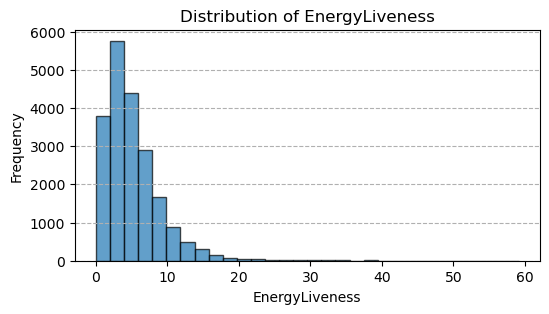

In [71]:
# Graphical representation: with Hist plot

plt.figure(figsize=(6,3))
plt.hist(df['EnergyLiveness'].dropna(), bins = 30, edgecolor='black', alpha=0.7)
plt.xlabel('EnergyLiveness')
plt.ylabel('Frequency')
plt.title('Distribution of EnergyLiveness')
plt.grid(axis='y', linestyle='--')
plt.show()

### Q.13 Plot histograms to show the distribution of danceability, energy, and loudness.

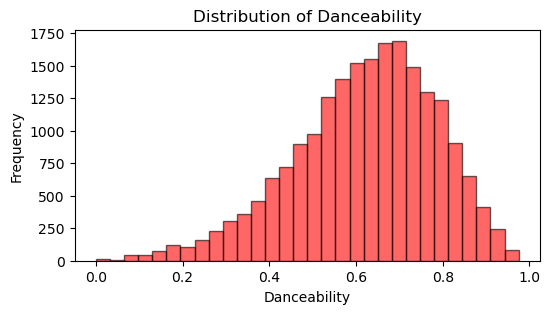

In [73]:
feature_dan = ['Danceability']

plt.figure(figsize = (6,3))
plt.hist(df[feature_dan], bins= 30, edgecolor='black',color='red', alpha=0.6)
plt.xlabel('Danceability')
plt.ylabel('Frequency')
plt.title('Distribution of Danceability')
plt.show()

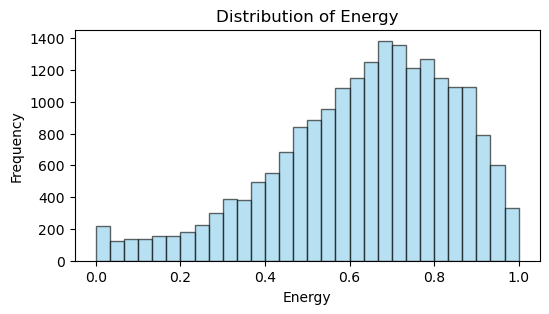

In [74]:
feature_eng = ['Energy']
plt.figure(figsize=(6,3))
plt.hist(df[feature_eng], bins=30, edgecolor='black', color='skyblue', alpha=0.6)
plt.xlabel('Energy')
plt.ylabel('Frequency')
plt.title('Distribution of Energy')
plt.show()

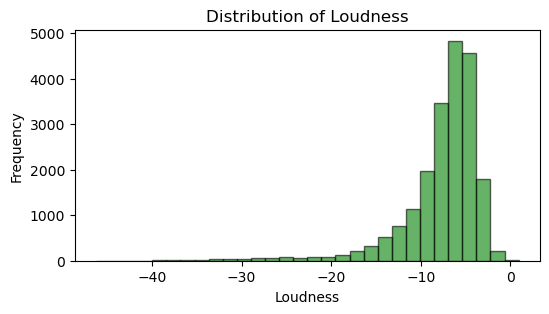

In [75]:
feature_loud = ['Loudness']
plt.figure(figsize=(6,3))
plt.hist(df[feature_loud], edgecolor='black', color='green', bins=30, alpha=0.6)
plt.xlabel('Loudness')
plt.ylabel('Frequency')
plt.title('Distribution of Loudness')
plt.show()

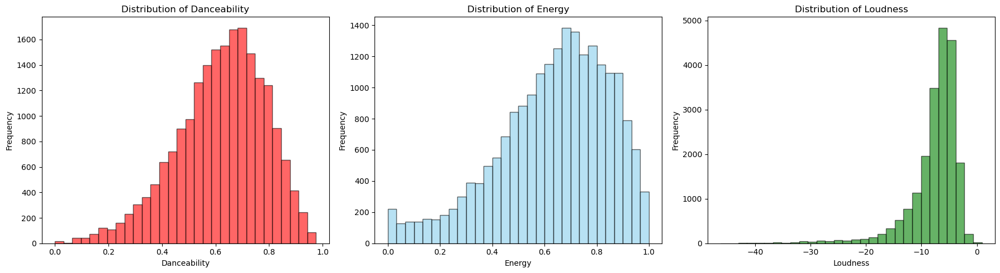

In [76]:
# SUBPLOT FOR ALL THREE
feature_dan = ['Danceability']
feature_eng = ['Energy']
feature_loud = ['Loudness']

fig, axes = plt.subplots(1, 3, figsize=(18, 5))  


axes[0].hist(df[feature_dan], bins=30, edgecolor='black', color='red', alpha=0.6) 
axes[0].set_xlabel('Danceability') # Danceability
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Danceability')


axes[1].hist(df[feature_eng], bins=30, edgecolor='black', color='skyblue', alpha=0.6)
axes[1].set_xlabel('Energy') # Energy
axes[1].set_ylabel('Frequency')
axes[1].set_title('Distribution of Energy')


axes[2].hist(df[feature_loud], bins=30, edgecolor='black', color='green', alpha=0.6)
axes[2].set_xlabel('Loudness') # Loudness
axes[2].set_ylabel('Frequency')
axes[2].set_title('Distribution of Loudness') 

plt.tight_layout()  
plt.show()

### Q.14 Use scatter plots to explore relationships between tempo and danceability or energy and valence.

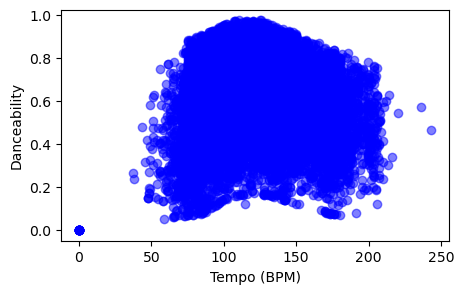

In [78]:
# Scatter plot: Tempo vs Danceability
plt.figure(figsize=(5,3))
plt.scatter(df['Tempo'], df['Danceability'], color='blue', alpha=0.5)
plt.xlabel('Tempo (BPM)')
plt.ylabel('Danceability')
plt.show()


# How to Read a Scatter Plot?
# A scatter plot shows the relationship between two variables. Each dot represents a data point. Here one dot means a song.
# Positive Correlation (Dots trend upward-right)
# Negative Correlation (Dots trend downward-right)
# No Clear Pattern (Randomly Scattered Dots)

##### as we can see, here are some songs which have tempo level very low(close to zero), so it could be seen that the danceability of those songs are also very low.

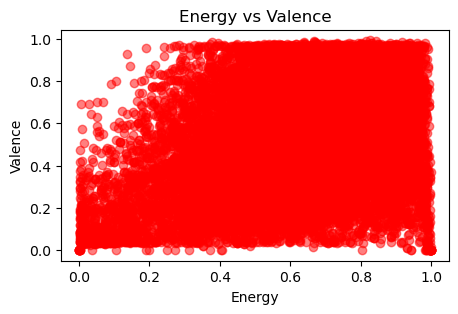

In [80]:
# Scatter plot: Energy vs Valence
plt.figure(figsize=(5,3))
plt.scatter(df['Energy'], df['Valence'], color='red', alpha=0.5)
plt.xlabel('Energy')
plt.ylabel('Valence')
plt.title('Energy vs Valence')
plt.show()

##### Valence: (meaning : describes the musical positivity conveyed by a piece of music. 
##### Songs with high valence sound more positive(e.g. happy, cheerful). low valance = sad(melancholic songs))

#### As we can see that both high and low energy songs are evenly spread across the valence range (0 to 1). it could mean here that  energetic songs can be both happy and sad, and similarly, calm songs also vary in mood. aslo we have already seen that mean = 0.530128, 50% = 0.538000(almost half of max = 993000), min = 0.000000, max = 0.993000, seems a balance because of mean.

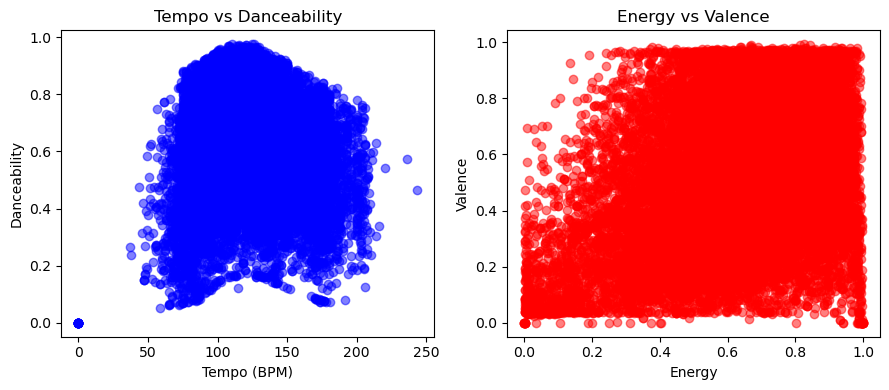

In [82]:
# making subplot:

fig, axes = plt.subplots(1, 2, figsize=(9, 4))


axes[0].scatter(df['Tempo'], df['Danceability'], color='blue', alpha=0.5)
axes[0].set_xlabel('Tempo (BPM)')
axes[0].set_ylabel('Danceability')
axes[0].set_title('Tempo vs Danceability')


axes[1].scatter(df['Energy'], df['Valence'], color='red', alpha=0.5)
axes[1].set_xlabel('Energy')
axes[1].set_ylabel('Valence')
axes[1].set_title('Energy vs Valence')

plt.tight_layout()
plt.show()


### Q.15 Which Album has the most tracks in the dataset? Using a bar chart.

top_album:  Greatest Hits
top_album_count for Greatest Hits:  30


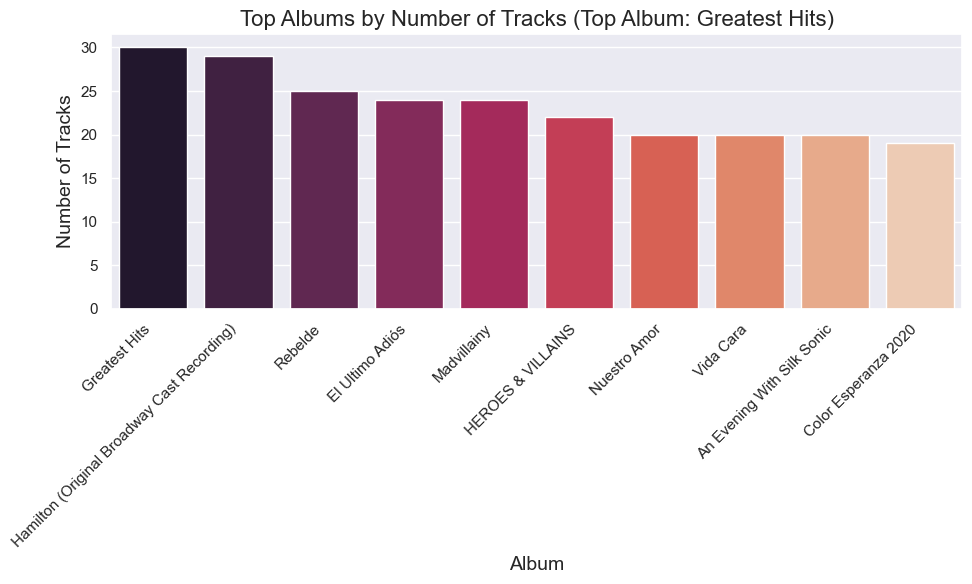

In [84]:
count_of_album = df['Album'].value_counts() # number of tracks
top_album = count_of_album.idxmax()  # album with the most tracks: top album
top_album_count = count_of_album.max()  # count of the most frequent album

print("top_album: ", top_album)
print(f"top_album_count for {top_album}: ", top_album_count)

# plotting a bar plot
plt.figure(figsize=(10, 6))
sns.set_theme(style="darkgrid")
sns.barplot(x=count_of_album.index[:10], y=count_of_album.values[:10], palette = 'rocket',  hue=count_of_album.index[:10])  # Top 10 albums
plt.title(f"Top Albums by Number of Tracks (Top Album: {top_album})", fontsize=16)
plt.xlabel("Album", fontsize=14)
plt.ylabel("Number of Tracks", fontsize=14)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability


plt.tight_layout()
plt.show()

In [85]:
df.columns

Index(['Artist', 'Track', 'Album', 'Album_type', 'Danceability', 'Energy',
       'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness',
       'Liveness', 'Valence', 'Tempo', 'Duration_min', 'Title', 'Channel',
       'Views', 'Likes', 'Comments', 'Licensed', 'official_video', 'Stream',
       'EnergyLiveness', 'most_playedon'],
      dtype='object')

# Here I will use some automatic Data Vizualization Liberaries of python.
## 1. Using dtale liberary

#### dtale is a Python library that automates Exploratory Data Analysis (EDA) by generating detailed reports on datasets.
#### It helps analysts and data scientists quickly understand data characteristics without manually writing code for each analysis.

In [ ]:
#!pip install dtale

##### importing the dtale liberary.

In [3]:
import dtale

##### showing the data with dtale.show()

dtale.show(df) 

#### Open it in new tab for interactive data visualization and exploration by clicking on top left corner 

## 2. Using ydata_profiling

In [5]:
#!pip install ydata_profiling

In [94]:
# importing the ydata_profiling liberary
from ydata_profiling import ProfileReport

In [95]:
profile = ProfileReport(df, explorative = True)

##### The dark_mode parameter does not exist in ydata-profiling.
##### If you want a dark mode, you must manually enable dark mode in Jupyter Notebook.
##### ydata-profiling is a Python library that extends Pandas for automated Exploratory Data Analysis (EDA).

In [96]:
# generating a html page for vizualization and automated Exploratory Data Analysis (EDA)
profile.to_file('output.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

##### in my current_directory/current_folder, there is a output.html file, which open in google for vizualization and automated Exploratory Data Analysis (EDA) to explore the report interactively.

In [97]:
# I have an output.html file in my current directory, but I can also see the report here in jupyter notebook:

profile.to_notebook_iframe()

-----
##### Through this report we can easily see the correlations heatmap and table in very less time. We can understand data easily by this report.
##### There is an Interaction section in the report through which we can analyze how two numerical variables relate to each other.
-----
##### Interaction Section: 
##### 1. We can see Scatter Plots.
##### 2. We can correlate the two features to identify patterns or trends
##### 3. It also helps in finding outliers
-----
##### Q.14 Use scatter plots to explore relationships between tempo and danceability or energy and valence.
##### Above Question I have sove through the scatter plotting, but in the report we can easily find the relationship between tempo and danceability or energy and valence.
-----
##### IF I go to the variable section and select in it, Danceability, then I would have all the statistical analysis handy very easily. 
##### We can easily see the distribution Graph.
-----
##### There is also functionality to analyse the Quantile statistics aand Descriptive statistics
-----

# 3. Using dataprepLiberary

## In jupyter notebook this liberary is not working but I have used 'VS Code' it is working without any discripencies by just running few lines of code mentioned below: 
##### import pandas as pd

##### -->!pip install --upgrade pip            --> in terminal of VS Code

##### from dataprep.eda import create_report

##### -->Example dataset (replace with your actual DataFrame)
##### df = pd.read_csv("Spotify_data.csv")

##### report = create_report(df)
##### report.show()  
##### report.save("data_prep_report.html")

##### create_report(df).show_browser() # directly opens brower

##### -->Save report in folder
##### report = create_report(df)
##### report.save("eda_report.html")  # Report has been saved to eda_report.html! in the current directory.


##### And It could also work fine in google collab online.rowser()













